## Loading the Dataset and Preprocessing

In [ ]:
pip install medmnist

In [2]:
import medmnist
print(medmnist.__version__)

3.0.2


In [3]:
from torchvision import datasets, transforms
from torch.utils.data import random_split, DataLoader

In [4]:
from tqdm import tqdm
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms

import medmnist
from medmnist import INFO, Evaluator
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import Subset
from torchvision import models, transforms
# torchvision and its modules
import torchvision
import torchvision.datasets as DS
import torchvision.transforms as transforms

# for plotting
import matplotlib.pyplot as plt
# for algebric computations
import numpy as np

download = True
data_flag = 'pneumoniamnist'
NUM_EPOCHS = 3
BATCH_SIZE = 128
lr = 0.001

info = INFO[data_flag]
task = info['task']
n_channels = info['n_channels']
n_classes = len(info['label'])

DataClass = getattr(medmnist, info['python_class'])
print(INFO[data_flag])


import torch
import torch.nn as nn
import sys
sys.path.append(r"C:\Users\q5696\AppData\Local\Programs\Python\Python311\Lib\site-packages")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



#preprocessing: MNIST reference: https://github.com/MedMNIST/MedMNIST/blob/main/examples/getting_started.ipynb
data_transform = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Resize((224, 224)),
    transforms.Normalize(mean=[.5], std=[.5])
])

# load the data
train_dataset = DataClass(split='train', transform=data_transform, download=download,size=224)
test_dataset = DataClass(split='test', transform=data_transform, download=download,size=224)
val_dataset = DataClass(split="val", download=download, transform=data_transform,size=224)

# encapsulate data into dataloader form

# train_dataset.labels = train_dataset.labels.squeeze()
# val_dataset.labels = val_dataset.labels.squeeze()
# test_dataset.labels = test_dataset.labels.squeeze()

# 数据加载器
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

for images, labels in train_loader:
    print("Image batch shape:", images.shape)  # [64, 1, 224, 224] for grayscale
    print("Label batch shape:", labels.shape)  # [64]
    break
#PneumoniaMNIST	Chest X-Ray	Binary-Class (2)	5,856	4,708 / 524 / 624

def imshow(img):
    # remove the impact of normalization
    img = img / 2 + 0.5
    npimg = img.numpy()

    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

unique_labels_train = np.unique(train_dataset.labels)

unique_labels_test = np.unique(test_dataset.labels)

all_unique_labels = np.unique(
    np.concatenate([unique_labels_train ,unique_labels_test])
)

print(f"Total unique labels in dataset: {len(all_unique_labels)}")
print(f"Unique labels: {all_unique_labels}")

{'python_class': 'PneumoniaMNIST', 'description': 'The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384−2,916)×(127−2,713). We center-crop the images and resize them into 1×28×28.', 'url': 'https://zenodo.org/records/10519652/files/pneumoniamnist.npz?download=1', 'MD5': '28209eda62fecd6e6a2d98b1501bb15f', 'url_64': 'https://zenodo.org/records/10519652/files/pneumoniamnist_64.npz?download=1', 'MD5_64': '8f4eceb4ccffa70c672198ea285246c6', 'url_128': 'https://zenodo.org/records/10519652/files/pneumoniamnist_128.npz?download=1', 'MD5_128': '05b46931834c231683c68f40c47b2971', 'url_224': 'https://zenodo.org/records/10519652/files/pneumoniamnist_224.npz?download=1', 'MD5_224': 'd6a3c71de1b945ea11211b

In [ ]:

for i in range(5):
    image, label = train_dataset[i]
    print(image.shape)
    print(f"Label: {label} ")
    imshow(image)
 #ALSO ARE THESE THE RIGHT COLORS LOL??

## Building and Testing a CNN Model

In [19]:
import segmentation_models_pytorch as smp
import torch
import torch.nn as nn
import tqdm as notebook_tqdm
# class UNetForClassification(nn.Module):
#     def __init__(self, encoder_name="resnet18", encoder_weights="imagenet", in_channels=1, num_classes=1):
#         super(UNetForClassification, self).__init__()

#         # Initialize the UNet backbone from SMP
#         self.encoder = smp.Unet(
#             encoder_name=encoder_name,
#             encoder_weights=encoder_weights,
#             in_channels=in_channels,
#             classes=1  # Output 1 class, we'll handle classification separately
#         ).encoder
#         self.dropout = nn.Dropout(p=0.5)
#         # Add a classification head
#         self.pooling = nn.AdaptiveAvgPool2d(1)  # Global average pooling
#         self.fc = nn.Linear(self.encoder.out_channels[-1], num_classes)  # Fully connected layer
#         self.sigmoid = nn.Sigmoid()

#     def forward(self, x):
#         # Extract features using the encoder
#         features = self.encoder(x)[-1]  # Take the deepest feature map
#         # print(f"Features shape: {features.shape}")
        
#         pooled = self.pooling(features)  # Apply global average pooling
#         pooled = self.dropout(pooled)
#         pooled = pooled.view(pooled.size(0), -1)  # Flatten
#         output = self.fc(pooled)  # Fully connected layer
#         output = self.sigmoid(output)
#         return output

class UNetForClassification(nn.Module):
    def __init__(self, encoder_name="resnet18", encoder_weights="imagenet",
                 in_channels=1, num_classes=1, dropout_rate=0.5, freeze_encoder=False):
        super(UNetForClassification, self).__init__()

        # Initialize UNet encoder
        unet = smp.Unet(
            encoder_name=encoder_name,
            encoder_weights=encoder_weights,
            in_channels=in_channels,
            classes=1  # Dummy classes for segmentation; we're only using the encoder
        )
        self.encoder = unet.encoder

        # Optionally freeze the encoder
        if freeze_encoder:
            for param in self.encoder.parameters():
                param.requires_grad = False

        # Add global average pooling, dropout, and classification head
        self.pooling = nn.AdaptiveAvgPool2d(1)  # Global average pooling
        self.dropout = nn.Dropout(p=dropout_rate)
        self.fc = nn.Linear(self.encoder.out_channels[-1], num_classes)  # Fully connected layer
        self.norm = nn.BatchNorm1d(num_classes)  # Normalization layer
        self.sigmoid = nn.Sigmoid() if num_classes == 1 else None  # Sigmoid for binary classification

    def forward(self, x):
        # Extract features from the encoder
        features = self.encoder(x)[-1]  # Deepest feature map

        # Apply global average pooling
        pooled = self.pooling(features).view(features.size(0), -1)  # Flatten
        pooled = self.dropout(pooled)

        # Apply the fully connected layer and normalization
        output = self.fc(pooled)
        output = self.norm(output)

        # Activation (Sigmoid for binary classification)
        if self.sigmoid:
            output = self.sigmoid(output)

        return output
# Instantiate the model
if __name__ == "__main__":
    model = UNetForClassification(
        encoder_name="resnet18",
        encoder_weights="imagenet",
        in_channels=1,
        num_classes=1,  # Binary classification
        dropout_rate=0.4,
        freeze_encoder=False  # Allow the encoder to train
    )
criterion = nn.BCELoss()


original_layer = model.encoder.layer4[0].conv1
model.encoder.layer4[0].conv1 = nn.Conv2d(
    in_channels=original_layer.in_channels,  # Keep the same number of input channels
    out_channels=original_layer.out_channels,  # Keep the same number of output channels
    kernel_size=(5, 5),  # New kernel size
    stride=original_layer.stride,  # Keep the same stride
    padding=2  # Adjust padding to maintain the spatial dimensions (for "same" padding)
)

optimizer = torch.optim.Adam(model.parameters(), lr=0.00005, weight_decay=1e-4)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
#the link I sent, uses resnet18. Feel free to use it as guidance.
model = model.to(device)

def train(model, loader, criterion, optimizer, device):
    model.train()  # Set model to training mode
    total_loss = 0.0
    correct =0
    for data, targets in tqdm(loader, desc="Training", leave=False):

        data, targets = data.to(device), targets.to(device)

        # Ensure targets match output shape [batch_size, 1, height, width]
        if targets.dim() == 3:  # If targets are [batch_size, height, width]
            targets = targets.unsqueeze(1)  # Add channel dimension

        # Forward pass
        outputs = model(data)

        # Compute loss
        loss = criterion(outputs, targets.float())  # Ensure targets are float

        # Backward pass
        optimizer.zero_grad()
        
        loss.backward()
        optimizer.step()
        predictions = (outputs > 0.5)
            
        # Accumulate loss
        total_loss += loss.item()
        correct += (predictions == targets).sum().item()

    avg_loss = total_loss / len(loader)
    accuracy = correct / len(loader.dataset)
    return avg_loss,accuracy

def validate(model, loader, criterion, device):
    model.eval()
    total_loss, correct = 0, 0

    with torch.no_grad():
        for data, targets in loader:

            data, targets = data.to(device), targets.to(device)

            if targets.dim() == 3:  # If targets are [batch_size, height, width]
                targets = targets.unsqueeze(1)  # Add channel dimension

            outputs = model(data)
            loss = criterion(outputs, targets.float())
            predictions = (outputs > 0.5)

            total_loss += loss.item()
            correct += (predictions == targets).sum().item()


    return total_loss / len(loader), correct / len(loader.dataset)


cuda


Epoch [1/40]
Train Loss: 0.4256, Train Accuracy: 0.9297
Val Loss: 0.4146, Val Accuracy: 0.9790


Epoch [2/40]
Train Loss: 0.3847, Train Accuracy: 0.9817
Val Loss: 0.3946, Val Accuracy: 0.9656


Epoch [3/40]
Train Loss: 0.3779, Train Accuracy: 0.9930
Val Loss: 0.3913, Val Accuracy: 0.9790


Epoch [4/40]
Train Loss: 0.3733, Train Accuracy: 0.9972
Val Loss: 0.3901, Val Accuracy: 0.9885


Epoch [5/40]
Train Loss: 0.3711, Train Accuracy: 0.9977
Val Loss: 0.3858, Val Accuracy: 0.9905


Epoch [6/40]
Train Loss: 0.3683, Train Accuracy: 0.9996
Val Loss: 0.3865, Val Accuracy: 0.9866


Epoch [7/40]
Train Loss: 0.3664, Train Accuracy: 0.9992
Val Loss: 0.3904, Val Accuracy: 0.9885


Epoch [8/40]
Train Loss: 0.3650, Train Accuracy: 1.0000
Val Loss: 0.3857, Val Accuracy: 0.9885


Epoch [9/40]
Train Loss: 0.3627, Train Accuracy: 0.9998
Val Loss: 0.3797, Val Accuracy: 0.9924


Epoch [10/40]
Train Loss: 0.3611, Train Accuracy: 0.9998
Val Loss: 0.3843, Val Accuracy: 0.9847


Epoch [11/40]
Train Loss: 0.3601, Train Accuracy: 0.9996
Val Loss: 0.3832, Val Accuracy: 0.9885


Epoch [12/40]
Train Loss: 0.3578, Train Accuracy: 0.9996
Val Loss: 0.3767, Val Accuracy: 0.9905


Epoch [13/40]
Train Loss: 0.3556, Train Accuracy: 0.9998
Val Loss: 0.3755, Val Accuracy: 0.9905


Epoch [14/40]
Train Loss: 0.3557, Train Accuracy: 1.0000
Val Loss: 0.3779, Val Accuracy: 0.9866


Epoch [15/40]
Train Loss: 0.3533, Train Accuracy: 1.0000
Val Loss: 0.3747, Val Accuracy: 0.9847


Epoch [16/40]
Train Loss: 0.3519, Train Accuracy: 0.9998
Val Loss: 0.3745, Val Accuracy: 0.9847


Epoch [17/40]
Train Loss: 0.3508, Train Accuracy: 0.9998
Val Loss: 0.3671, Val Accuracy: 0.9905


Epoch [18/40]
Train Loss: 0.3482, Train Accuracy: 0.9998
Val Loss: 0.3728, Val Accuracy: 0.9847


Epoch [19/40]
Train Loss: 0.3472, Train Accuracy: 1.0000
Val Loss: 0.3627, Val Accuracy: 0.9943


Epoch [20/40]
Train Loss: 0.3459, Train Accuracy: 0.9998
Val Loss: 0.3682, Val Accuracy: 0.9905


Epoch [21/40]
Train Loss: 0.3441, Train Accuracy: 1.0000
Val Loss: 0.3638, Val Accuracy: 0.9943


Epoch [22/40]
Train Loss: 0.3413, Train Accuracy: 1.0000
Val Loss: 0.3618, Val Accuracy: 0.9905


Epoch [23/40]
Train Loss: 0.3402, Train Accuracy: 1.0000
Val Loss: 0.3701, Val Accuracy: 0.9885


Epoch [24/40]
Train Loss: 0.3405, Train Accuracy: 0.9992
Val Loss: 0.3632, Val Accuracy: 0.9847


Epoch [25/40]
Train Loss: 0.3379, Train Accuracy: 0.9998
Val Loss: 0.3668, Val Accuracy: 0.9828


Epoch [26/40]
Train Loss: 0.3366, Train Accuracy: 0.9998
Val Loss: 0.3560, Val Accuracy: 0.9943


Epoch [27/40]
Train Loss: 0.3362, Train Accuracy: 1.0000
Val Loss: 0.3603, Val Accuracy: 0.9885


Epoch [28/40]
Train Loss: 0.3347, Train Accuracy: 0.9998
Val Loss: 0.3635, Val Accuracy: 0.9828


Epoch [29/40]
Train Loss: 0.3315, Train Accuracy: 1.0000
Val Loss: 0.3534, Val Accuracy: 0.9924


Epoch [30/40]
Train Loss: 0.3315, Train Accuracy: 1.0000
Val Loss: 0.3482, Val Accuracy: 0.9924


Epoch [31/40]
Train Loss: 0.3306, Train Accuracy: 0.9994
Val Loss: 0.3486, Val Accuracy: 0.9885


Epoch [32/40]
Train Loss: 0.3296, Train Accuracy: 0.9996
Val Loss: 0.3531, Val Accuracy: 0.9866


Epoch [33/40]
Train Loss: 0.3274, Train Accuracy: 0.9989
Val Loss: 0.3533, Val Accuracy: 0.9885


Epoch [34/40]
Train Loss: 0.3254, Train Accuracy: 0.9994
Val Loss: 0.3439, Val Accuracy: 0.9962


Epoch [35/40]
Train Loss: 0.3253, Train Accuracy: 0.9994
Val Loss: 0.3463, Val Accuracy: 0.9924


Epoch [36/40]
Train Loss: 0.3229, Train Accuracy: 0.9996
Val Loss: 0.3371, Val Accuracy: 0.9943


Epoch [37/40]
Train Loss: 0.3212, Train Accuracy: 1.0000
Val Loss: 0.3419, Val Accuracy: 0.9943


Epoch [38/40]
Train Loss: 0.3191, Train Accuracy: 0.9998
Val Loss: 0.3415, Val Accuracy: 0.9905


Epoch [39/40]
Train Loss: 0.3195, Train Accuracy: 0.9989
Val Loss: 0.3939, Val Accuracy: 0.9523


Epoch [40/40]
Train Loss: 0.3196, Train Accuracy: 0.9975
Val Loss: 0.3395, Val Accuracy: 0.9828


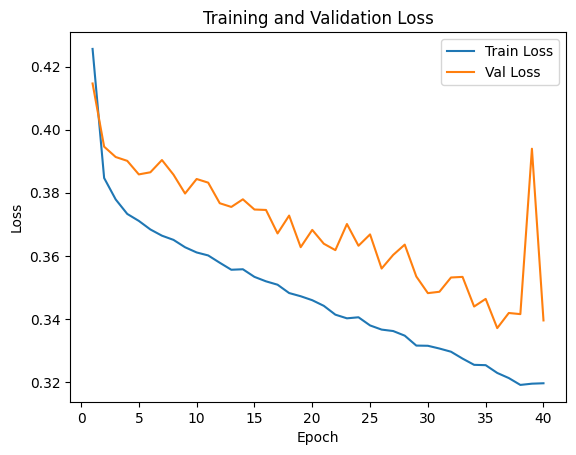

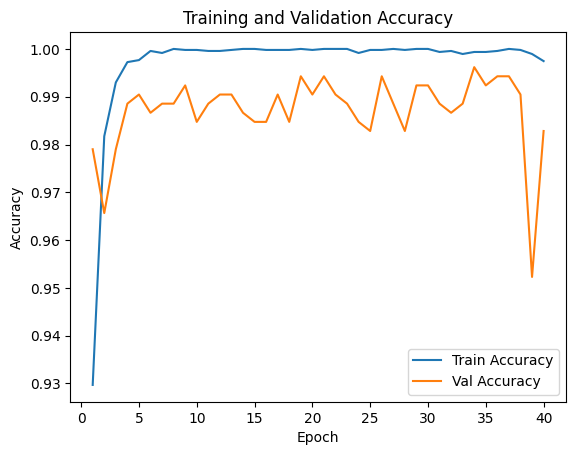

In [20]:
num_epochs = 40
best_accuracy = 0

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    # train
    train_loss, train_accuracy = train(model, train_loader, criterion, optimizer, device)
    val_loss, val_accuracy = validate(model, val_loader, criterion, device)


    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)


    print(f"Epoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

    # save best epoch
    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        torch.save(model.state_dict(), "best_unet_restnet18_binaryclass2.pth")


plt.figure()
plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


plt.figure()
plt.plot(range(1, num_epochs+1), train_accuracies, label='Train Accuracy')
plt.plot(range(1, num_epochs+1), val_accuracies, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()


In [23]:
model = UNetForClassification(num_classes=1)  # Binary classification typically uses 1 output channel

# Load the model weights
state_dict = torch.load("best_unet_restnet18_binaryclass.pth", weights_only=True, map_location=torch.device('cuda'))
model.load_state_dict(state_dict)
# Set the model to evaluation mode
model.eval()
model = model.to(device)

In [24]:
all_preds = []
all_labels = []
print(device)
total_samples = 0
total_loss, correct = 0, 0
# Run the model on the test dataset
# val_loss, val_accuracy = validate(model, test_loader, criterion, device)
with torch.no_grad():  # Disable gradient calculation for inference
    for images, labels in test_loader:
        
        # Move data to the same device as the model (e.g., GPU or CPU)
        images, labels = images.to(device), labels.to(device)

        if labels.dim() == 3:  # If targets are [batch_size, height, width]
            targets = targets.unsqueeze(1)  # Add channel dimension

        outputs = model(images)
        loss = criterion(outputs, labels.float())
        predictions = (outputs > 0.5)

        total_loss += loss.item()
        correct += (predictions == labels).sum().item()
        total_samples += labels.size(0)
accuracy=correct/total_samples
# Calculate precision using sklearn
print(f"Total on the test dataset: {total_samples:d}")

print(f"Precision on the test dataset: {accuracy:.4f}")

cuda
Total on the test dataset: 624
Precision on the test dataset: 0.9359


In [ ]:
import captum
from captum.attr import IntegratedGradients, visualization
ig = IntegratedGradients(model)
for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    images.requires_grad_()  # Required for attributions
    outputs = model(images)  # Get model predictions
    predicted = (outputs > 0.5).long()  # Binary classification threshold at 0.5

    # Get attributions using Integrated Gradients
    attributions, delta = ig.attribute(images, target=0, return_convergence_delta=True)

    # Visualization
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title(f"Original Image\nLabel: {labels.item()}")
    plt.imshow(images[0, 0].detach().numpy(), cmap="gray")
    plt.axis("off")

    # Attribution Heatmap
    plt.subplot(1, 3, 2)
    plt.title("Attributions")
    visualization.visualize_image_attr(attributions[0, 0].detach().numpy(), images[0, 0].detach().numpy(),
                                       method="heat_map", cmap="inferno", show_colorbar=True)

    # Prediction Result
    plt.subplot(1, 3, 3)
    is_correct = "Correct" if predicted.item() == labels.item() else "Incorrect"
    plt.title(f"Prediction: {predicted.item()}\n{is_correct}")
    plt.imshow(images[0, 0].detach().numpy(), cmap="gray")
    plt.axis("off")

    plt.show()

    # Break after visualizing the first image
    break

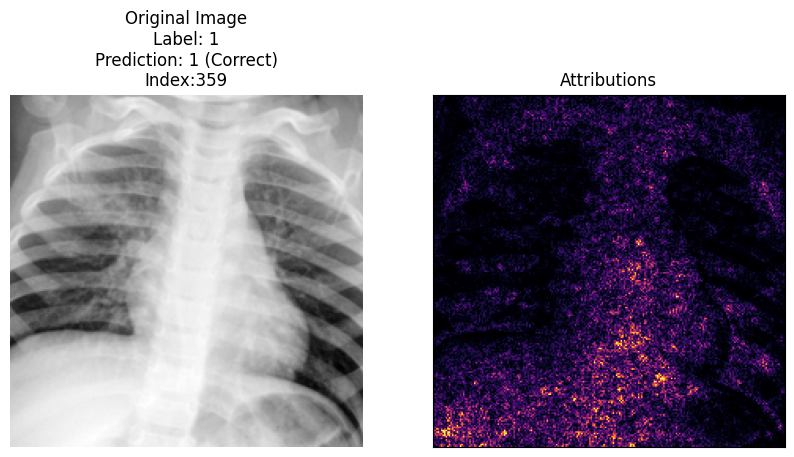

<Figure size 640x480 with 0 Axes>

In [ ]:
import captum
from captum.attr import IntegratedGradients, visualization
ig = IntegratedGradients(model)
for i, (images, labels) in enumerate(test_loader):  # Add index `i` for tracking
    if(i==359):
        images = images.cuda()  # Move images to GPU
        labels = labels.cuda()  # Move labels to GPU if needed

        images.requires_grad_()  # Required for attributions
        outputs = model(images)  # Get model predictions
        predicted = (outputs > 0.5).long()  # Binary classification threshold at 0.5

        # Get attributions using Integrated Gradients
        attributions, delta = ig.attribute(images, target=0, return_convergence_delta=True)

        # Move tensors back to CPU for visualization
        images_cpu = images.cpu()
        attributions_cpu = attributions.cpu()
        labels_cpu = labels.cpu()
        predicted_cpu = predicted.cpu()

        # Expand dimensions to make them compatible with Captum's visualization tools
        attributions_3d = np.expand_dims(attributions_cpu[0, 0].detach().numpy(), axis=-1)  # Shape: (H, W) -> (H, W, 1)
        images_3d = np.expand_dims(images_cpu[0, 0].detach().numpy(), axis=-1)              # Shape: (H, W) -> (H, W, 1)

        # Visualization
        plt.figure(figsize=(10, 10))

        # Original Image
        plt.subplot(1, 2, 1)
        plt.title(f"Original Image\nLabel: {labels_cpu.item()}")
        is_correct = "Correct" if predicted_cpu.item() == labels_cpu.item() else "Incorrect"
        plt.title(f"Original Image\nLabel: {labels_cpu.item()}\nPrediction: {predicted_cpu.item()} ({is_correct})\nIndex:{i}")




        
        plt.imshow(images_cpu[0, 0].detach().numpy(), cmap="gray")
        plt.axis("off")

        # Attribution Heatmap
        plt.subplot(1, 2, 2)
        plt.title("Attributions")
        visualization.visualize_image_attr(
            attributions_3d,
            images_3d,
            method="heat_map",
            cmap="inferno",
            show_colorbar=False,  # Disable colorbar for subplot
            plt_fig_axis=(plt.gcf(), plt.gca())  # Use current figure and axis
        )




        plt.tight_layout()
        plt.show()

    # Optional: Pause to check images one by one
    # input(f"Image {i+1}/{len(test_loader)}: Press Enter to continue...")

    # Uncomment the line below if you want to stop after a fixed number of images
    # if i == 9: break  # Stop after 10 images


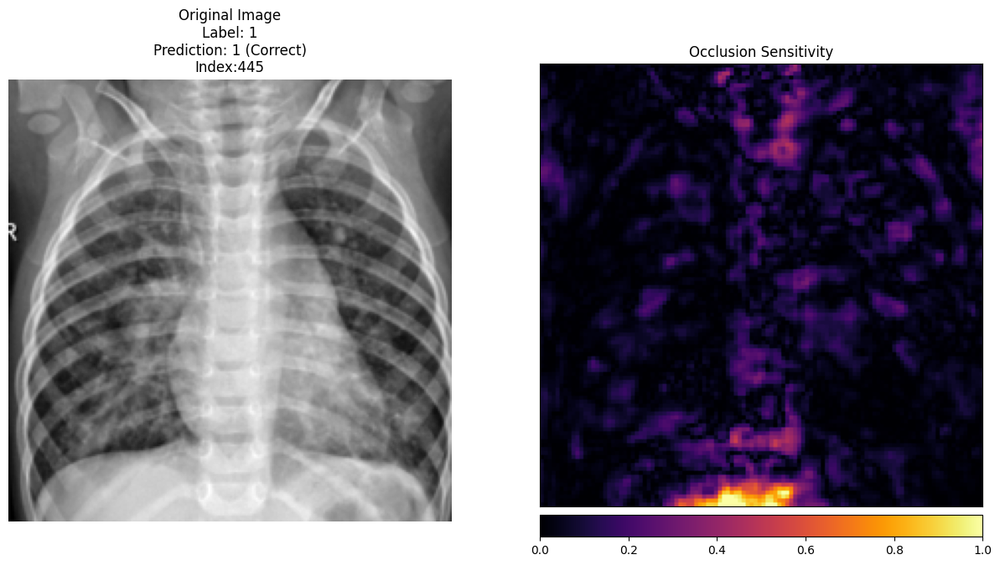

<Figure size 640x480 with 0 Axes>

In [30]:
import matplotlib.pyplot as plt
import numpy as np
import captum
from captum.attr import IntegratedGradients, GradientShap, Occlusion, visualization
import matplotlib.pyplot as plt
import numpy as np
ig = IntegratedGradients(model)
gradient_shap = GradientShap(model)
occlusion = Occlusion(model)
for i, (images, labels) in enumerate(test_loader):  # Add index `i` for tracking
    if(i==445):
        images = images.cuda()  # Move images to GPU
        labels = labels.cuda()  # Move labels to GPU if needed

        images.requires_grad_()  # Required for attributions
        outputs = model(images)  # Get model predictions
        predicted = (outputs > 0.5).long()  # Binary classification threshold at 0.5

        # **Integrated Gradients Attributions**
        ig_attributions, ig_delta = ig.attribute(images, target=0, return_convergence_delta=True)

        # **Gradient SHAP Attributions**
        # gs_attributions = gradient_shap.attribute(images, baselines=baseline, target=0)

        # **Occlusion Attributions**
        occlusion_attributions = occlusion.attribute(
            images,
            strides=(1,2,2),
            target=0,
            sliding_window_shapes=(1,4,4)
        )

        # Move tensors back to CPU for visualization
        images_cpu = images.cpu()
        labels_cpu = labels.cpu()
        predicted_cpu = predicted.cpu()

        # Prepare input images and attributions
        images_3d = np.expand_dims(images_cpu[0, 0].detach().numpy(), axis=-1)  # Shape: (H, W) -> (H, W, 1)
        ig_attributions_3d = np.expand_dims(ig_attributions[0, 0].cpu().detach().numpy(), axis=-1)
        # gs_attributions_3d = np.expand_dims(gs_attributions[0, 0].cpu().detach().numpy(), axis=-1)
        occlusion_attributions_3d = np.expand_dims(occlusion_attributions[0, 0].cpu().detach().numpy(), axis=-1)

        # Visualization
        plt.figure(figsize=(15, 10))  # Adjust figure size for better visualization

        # Original Image
        # plt.subplot(2, 2, 1)
        plt.subplot(1, 2, 1)
        is_correct = "Correct" if predicted_cpu.item() == labels_cpu.item() else "Incorrect"
        plt.title(f"Original Image\nLabel: {labels_cpu.item()}\nPrediction: {predicted_cpu.item()} ({is_correct})\nIndex:{i}")
        plt.imshow(images_cpu[0, 0].detach().numpy(), cmap="gray")
        plt.axis("off")

        # Integrated Gradients
        # plt.subplot(1, 2, 2)
        # plt.title("Integrated Gradients")
        # visualization.visualize_image_attr(
        #     ig_attributions_3d,
        #     images_3d,
        #     method="heat_map",
        #     cmap="inferno",
        #     show_colorbar=True,
        #     plt_fig_axis=(plt.gcf(), plt.gca())
        # )
        
        # # Gradient SHAP
        # plt.subplot(2, 2, 3)
        # plt.title("Gradient SHAP")
        # visualization.visualize_image_attr(
        #     gs_attributions_3d,
        #     images_3d,
        #     method="heat_map",
        #     cmap="coolwarm",
        #     show_colorbar=True,
        #     plt_fig_axis=(plt.gcf(), plt.gca())
        # )

        # # Occlusion Sensitivity
        plt.subplot(1, 2, 2)
        plt.title("Occlusion Sensitivity")
        visualization.visualize_image_attr(
            occlusion_attributions_3d,
            images_3d,
            method="heat_map",
            cmap="inferno",
            show_colorbar=True,
            plt_fig_axis=(plt.gcf(), plt.gca())
        )

        plt.tight_layout()  # Adjust spacing between subplots
        plt.show()

    # Optional: Pause to check images one by one
    # input(f"Image {i+1}/{len(test_loader)}: Press Enter to continue...")

    # Uncomment the line below if you want to stop after a fixed number of images
    # if i == 9: break  # Stop after 10 images


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.27904751192092897..0.8927018844566346].


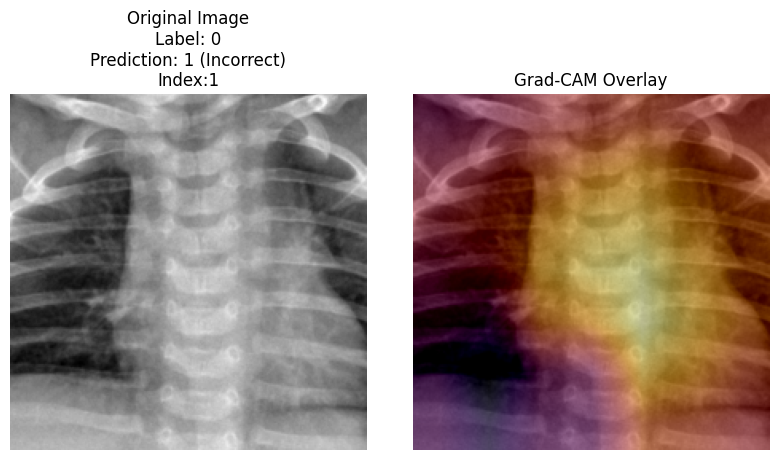

In [22]:
from captum.attr import LayerGradCam, visualization
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import cm
# Initialize Grad-CAM
grad_cam = LayerGradCam(model, model.encoder.layer4)  # Replace `model.layer_name` with your model's final convolutional layer

for i, (images, labels) in enumerate(test_loader):  # Add index `i` for tracking
    if i == 1:
        images = images.cuda()  # Move images to GPU
        labels = labels.cuda()  # Move labels to GPU if needed

        images.requires_grad_()  # Required for attributions
        outputs = model(images)  # Get model predictions
        predicted = (outputs > 0.5).long()  # Binary classification threshold at 0.5

        # **Grad-CAM Attribution**
        gradcam_attr = grad_cam.attribute(images, target=0)  # Compute Grad-CAM for target class (e.g., class 0)

        # Upscale Grad-CAM to match the input image size
        gradcam_attr_upsampled = torch.nn.functional.interpolate(
            gradcam_attr, size=images.shape[2:], mode="bilinear", align_corners=False
        )

        # Move tensors back to CPU for visualization
        images_cpu = images.cpu()
        labels_cpu = labels.cpu()
        predicted_cpu = predicted.cpu()
        gradcam_attr_cpu = gradcam_attr_upsampled.cpu().squeeze().detach().numpy()

        # Prepare the original image
        images_3d = images_cpu[0, 0].detach().numpy()  # Convert to 2D array (H, W)

        # Visualization
        fig, axes = plt.subplots(1, 2, figsize=(8, 8))
        
        is_correct = "Correct" if predicted_cpu.item() == labels_cpu.item() else "Incorrect"


        axes[0].imshow(images_cpu[0, 0].detach().numpy(), cmap="gray")
        axes[0].axis("off")
        axes[0].set_title(f"Original Image\nLabel: {labels_cpu.item()}\nPrediction: {predicted_cpu.item()} ({is_correct})\nIndex:{i}")
        # plt.imshow(images_cpu[0, 0].detach().numpy(), cmap="gray")
        # plt.axis("off")

        # Grad-CAM
        # plt.subplot(1, 2, 2)
        # plt.title("Grad-CAM")
        gradcam_attr_cpu_normalized = (gradcam_attr_cpu - gradcam_attr_cpu.min()) / (gradcam_attr_cpu.max() - gradcam_attr_cpu.min())

        # Convert Grad-CAM to a color map
        heatmap = cm.inferno(gradcam_attr_cpu_normalized)[:, :, :3]  # Take RGB channels from the colormap

        # Expand the grayscale original image to 3 channels
        images_3d_rgb = np.stack([images_3d] * 3, axis=-1)  # Shape: (224, 224) -> (224, 224, 3)

        # Blend the original image and the heatmap
        overlay = 0.5 * images_3d_rgb + 0.5 * heatmap  # Blend the two images

        # Plot the overlay
        plt.tight_layout()
        
        axes[1].imshow(overlay)
        axes[1].axis("off")
        axes[1].set_title("Grad-CAM Overlay")
        plt.show()



    # Optional: Pause to check images one by one
    # input(f"Image {i+1}/{len(test_loader)}: Press Enter to continue...")

    # Uncomment the line below if you want to stop after a fixed number of images
    # if i == 9: break  # Stop after 10 images


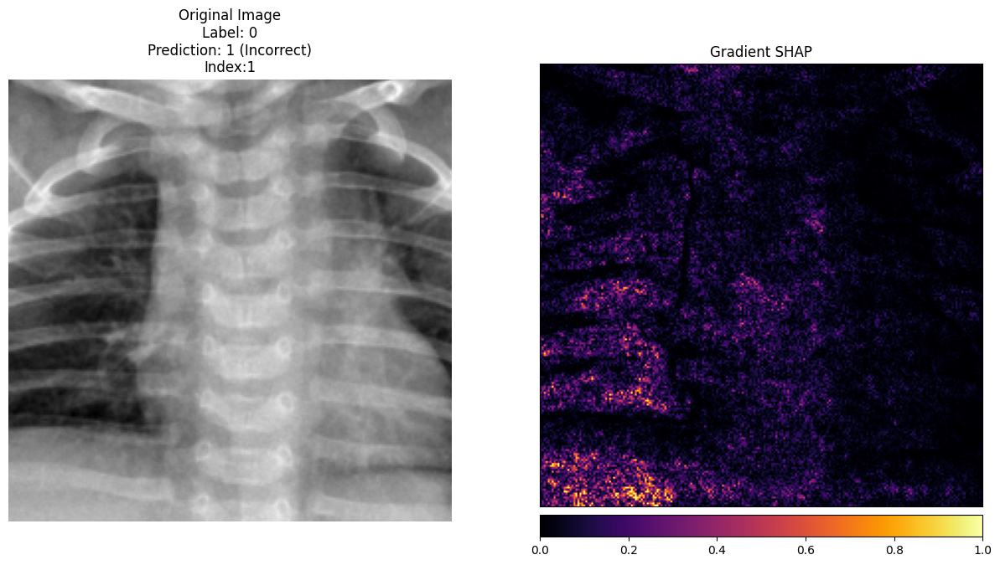

<Figure size 640x480 with 0 Axes>

In [42]:
import matplotlib.pyplot as plt
import numpy as np
import captum
from captum.attr import IntegratedGradients, GradientShap, Occlusion, visualization
import matplotlib.pyplot as plt
import numpy as np
ig = IntegratedGradients(model)
gradient_shap = GradientShap(model)
occlusion = Occlusion(model)
baseline = torch.zeros_like(next(iter(test_loader))[0]).cuda() 
for i, (images, labels) in enumerate(test_loader):  # Add index `i` for tracking
    if(i==1):
        images = images.cuda()  # Move images to GPU
        labels = labels.cuda()  # Move labels to GPU if needed

        images.requires_grad_()  # Required for attributions
        outputs = model(images)  # Get model predictions
        predicted = (outputs > 0.5).long()  # Binary classification threshold at 0.5

        # **Integrated Gradients Attributions**
        ig_attributions, ig_delta = ig.attribute(images, target=0, return_convergence_delta=True)

        # **Gradient SHAP Attributions**
        gs_attributions = gradient_shap.attribute(images, baselines=baseline, target=0)

        # **Occlusion Attributions**
        # occlusion_attributions = occlusion.attribute(
        #     images,
        #     strides=(1,2,2),
        #     target=0,
        #     sliding_window_shapes=(1,4,4)
        # )

        # Move tensors back to CPU for visualization
        images_cpu = images.cpu()
        labels_cpu = labels.cpu()
        predicted_cpu = predicted.cpu()

        # Prepare input images and attributions
        images_3d = np.expand_dims(images_cpu[0, 0].detach().numpy(), axis=-1)  # Shape: (H, W) -> (H, W, 1)
        # ig_attributions_3d = np.expand_dims(ig_attributions[0, 0].cpu().detach().numpy(), axis=-1)
        gs_attributions_3d = np.expand_dims(gs_attributions[0, 0].cpu().detach().numpy(), axis=-1)
        # occlusion_attributions_3d = np.expand_dims(occlusion_attributions[0, 0].cpu().detach().numpy(), axis=-1)

        # Visualization
        plt.figure(figsize=(15, 10))  # Adjust figure size for better visualization

        # Original Image
        # plt.subplot(2, 2, 1)
        plt.subplot(1, 2, 1)
        is_correct = "Correct" if predicted_cpu.item() == labels_cpu.item() else "Incorrect"
        plt.title(f"Original Image\nLabel: {labels_cpu.item()}\nPrediction: {predicted_cpu.item()} ({is_correct})\nIndex:{i}")
        plt.imshow(images_cpu[0, 0].detach().numpy(), cmap="gray")
        plt.axis("off")

        # Integrated Gradients
        # plt.subplot(1, 2, 2)
        # plt.title("Integrated Gradients")
        # visualization.visualize_image_attr(
        #     ig_attributions_3d,
        #     images_3d,
        #     method="heat_map",
        #     cmap="inferno",
        #     show_colorbar=True,
        #     plt_fig_axis=(plt.gcf(), plt.gca())
        # )
        
        # # Gradient SHAP
        plt.subplot(1, 2, 2)
        plt.title("Gradient SHAP")
        visualization.visualize_image_attr(
            gs_attributions_3d,
            images_3d,
            method="heat_map",
            cmap="inferno",
            show_colorbar=True,
            plt_fig_axis=(plt.gcf(), plt.gca())
        )

        # # Occlusion Sensitivity
        # plt.subplot(1, 2, 2)
        # plt.title("Occlusion Sensitivity")
        # visualization.visualize_image_attr(
        #     occlusion_attributions_3d,
        #     images_3d,
        #     method="heat_map",
        #     cmap="inferno",
        #     show_colorbar=True,
        #     plt_fig_axis=(plt.gcf(), plt.gca())
        # )

        plt.tight_layout()  # Adjust spacing between subplots
        plt.show()

    # Optional: Pause to check images one by one
    # input(f"Image {i+1}/{len(test_loader)}: Press Enter to continue...")

    # Uncomment the line below if you want to stop after a fixed number of images
    # if i == 9: break  # Stop after 10 images

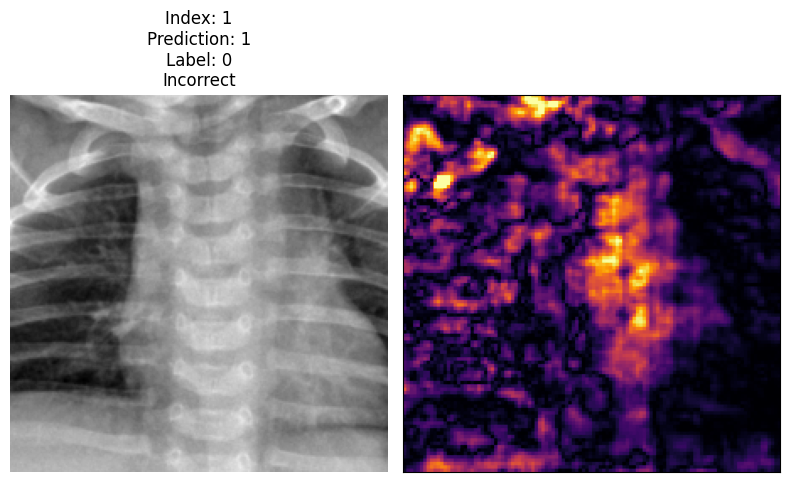

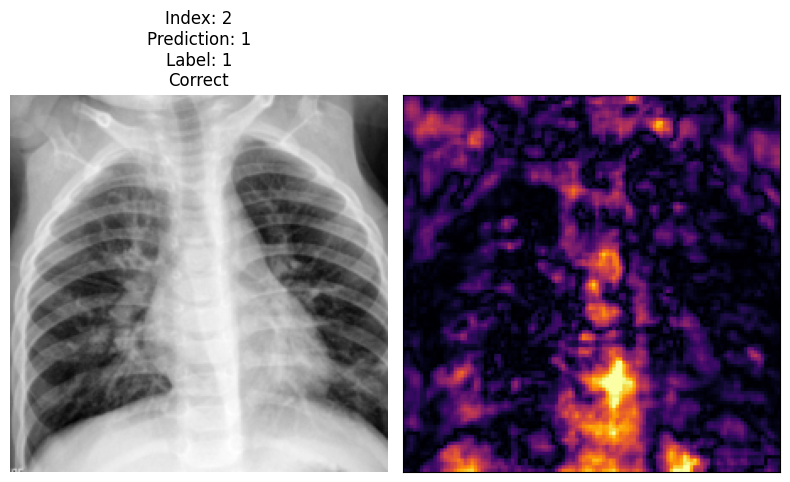

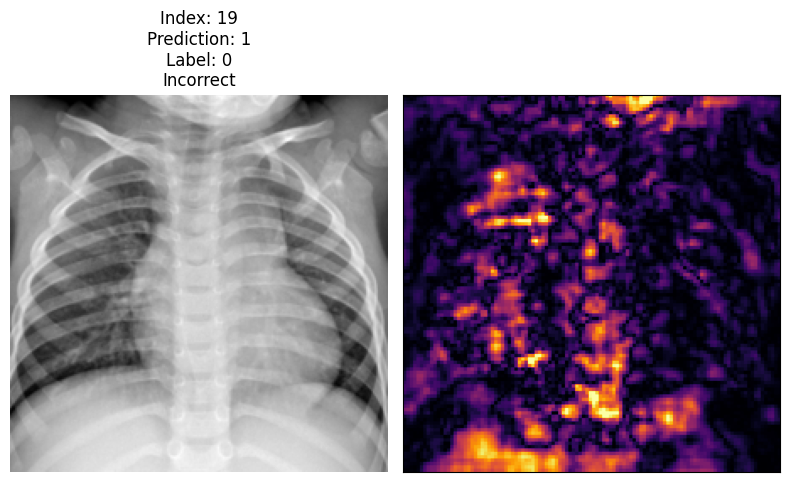

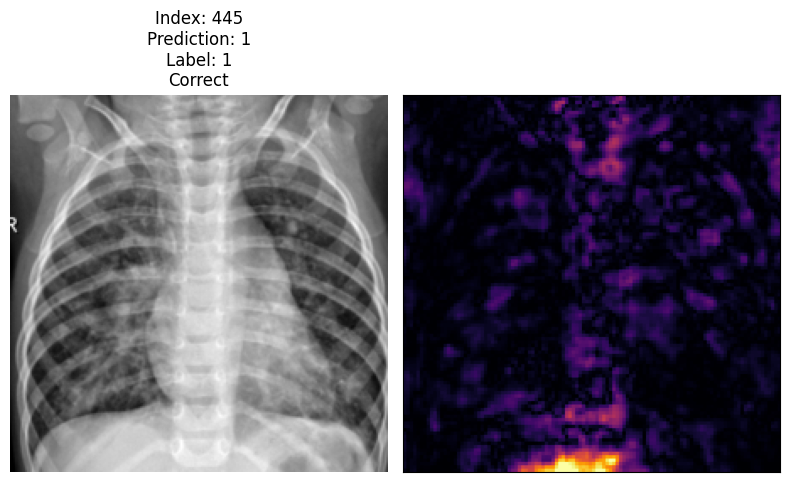

In [ ]:
# Specify the indices to visualize
import matplotlib.pyplot as plt
import numpy as np
from captum.attr import Occlusion, visualization

ig = Occlusion(model)  # Initialize Occlusion
model.eval()
target_indices = {445}  # Set of target indices
processed_count = 0  # Initialize counter
max_samples = len(target_indices)  # Maximum number of samples to process

for i, (images, labels) in enumerate(test_loader):
    if processed_count >= max_samples:  # Check if maximum samples are processed
        break
    images, labels = images.to(device), labels.to(device)
    images.requires_grad_()

    # Model prediction
    outputs = torch.sigmoid(model(images))  # Convert logits to probabilities
    predicted = (outputs > 0.5).long()      # Binary classification threshold
    predicted_cpu = predicted.cpu()
    labels_cpu = labels.cpu()

    # Iterate over each sample in the batch
    for j in range(images.size(0)):
        global_index = i * test_loader.batch_size + j

        if global_index not in target_indices:
            continue

        image = images[j].unsqueeze(0)  # Keep the input shape
        label = labels_cpu[j].item()
        predicted_label = int(predicted_cpu[j].item())  # Extract predicted label

        is_correct = "Correct" if predicted_label == label else "Incorrect"

        # Compute attributions
        attributions = ig.attribute(
            inputs=image,
            strides=(1, 2, 2),
            target=0,  # Fixed target for binary classification
            sliding_window_shapes=(1, 4, 4),
            baselines=torch.zeros_like(image)
        )

        attributions_3d = np.expand_dims(attributions[0, 0].detach().cpu().numpy(), axis=-1)
        image_3d = np.expand_dims(image[0, 0].detach().cpu().numpy(), axis=-1)

        # Visualization
        fig, axes = plt.subplots(1, 2, figsize=(8, 8))

        axes[0].imshow(image_3d.squeeze(), cmap="gray")
        axes[0].axis("off")
        axes[0].set_title(
            f"Index: {global_index}\nPrediction: {predicted_label}\nLabel: {label}\n{is_correct}"
        )

        visualization.visualize_image_attr(
            attributions_3d,
            image_3d,
            method="heat_map",
            cmap="inferno",
            show_colorbar=False,
            plt_fig_axis=(fig, axes[1]),
            use_pyplot=False
        )

        plt.tight_layout()
        plt.show()

        processed_count += 1

    if processed_count >= max_samples:  # Check again if maximum samples are processed
        break


tensor([[0]], device='cuda:0', dtype=torch.int32)


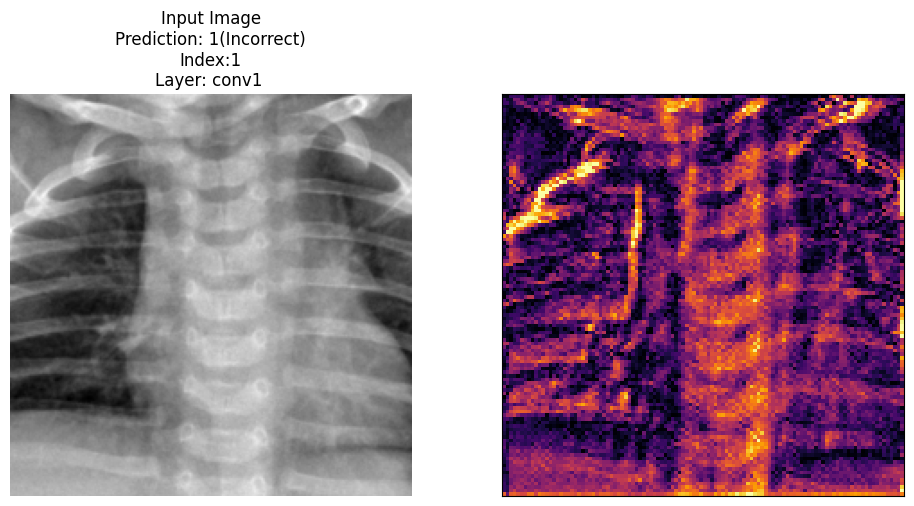

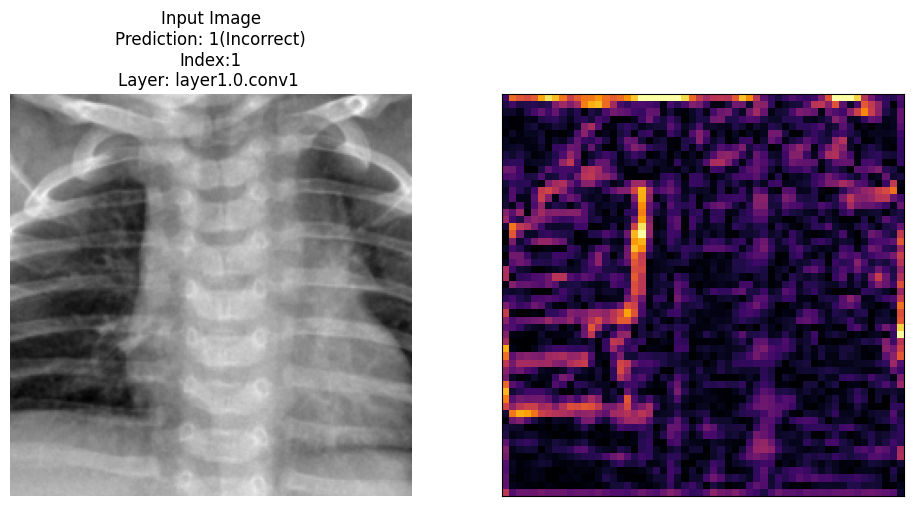

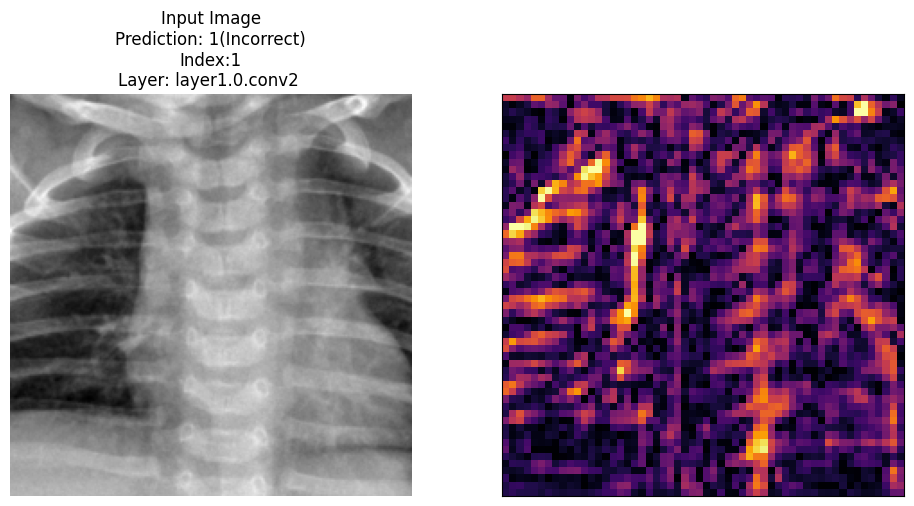

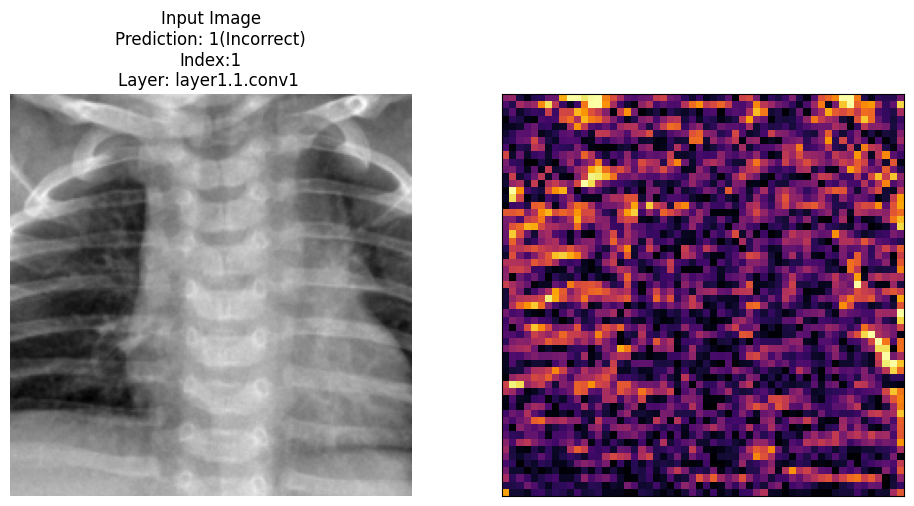

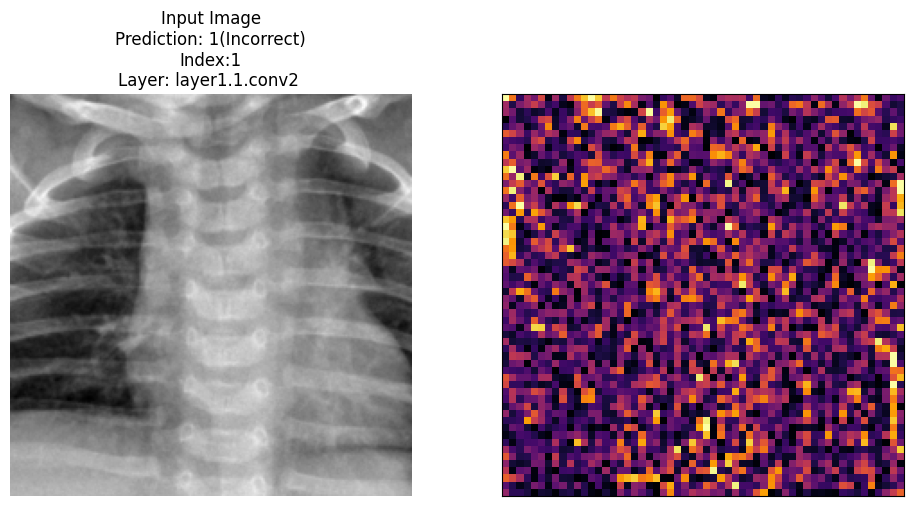

...

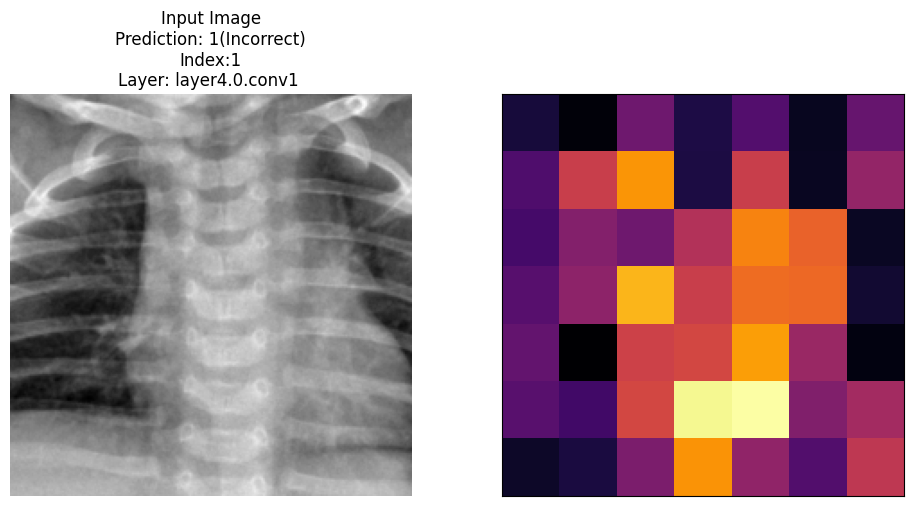

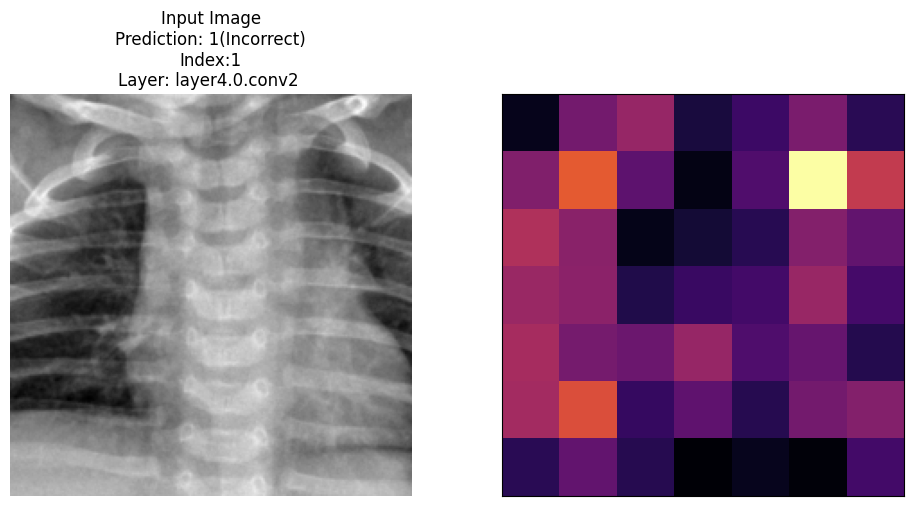

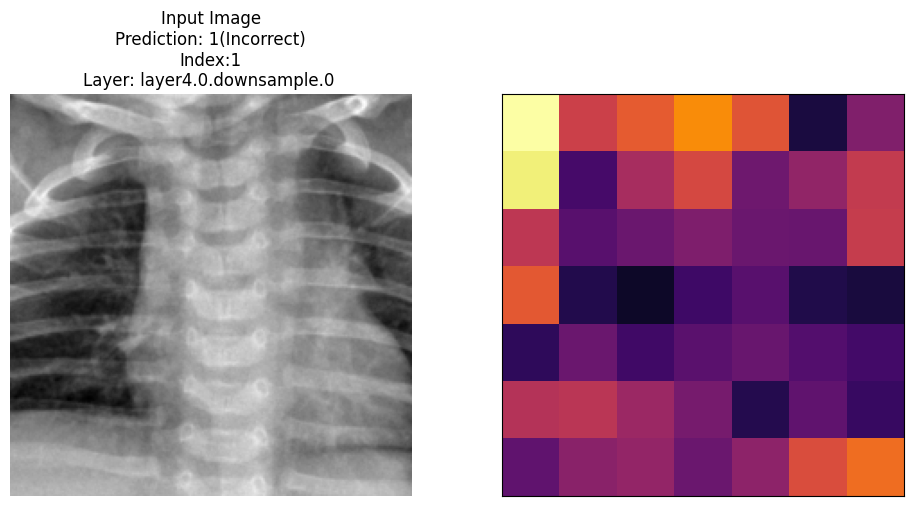

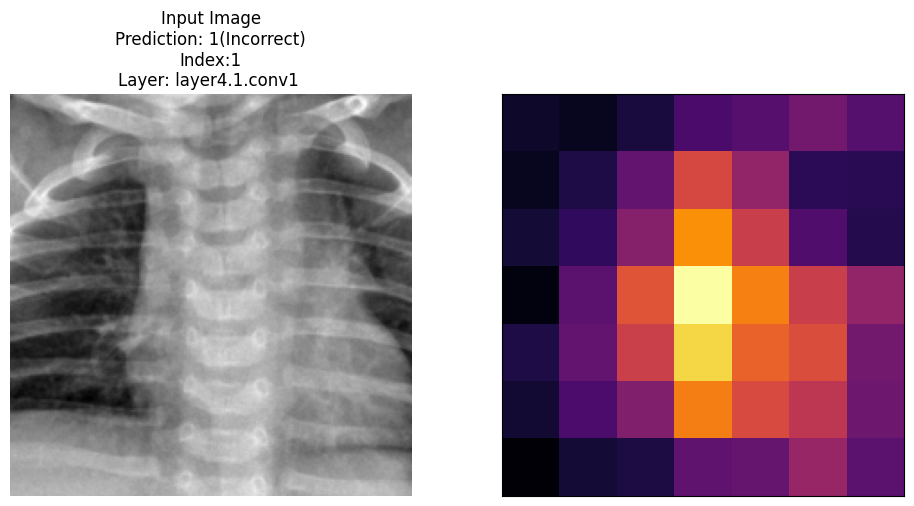

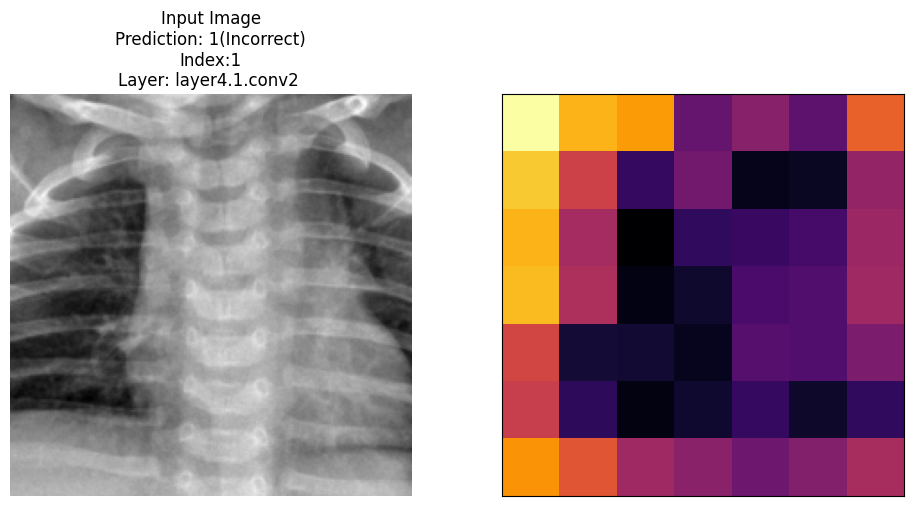

tensor([[0]], device='cuda:0', dtype=torch.int32)


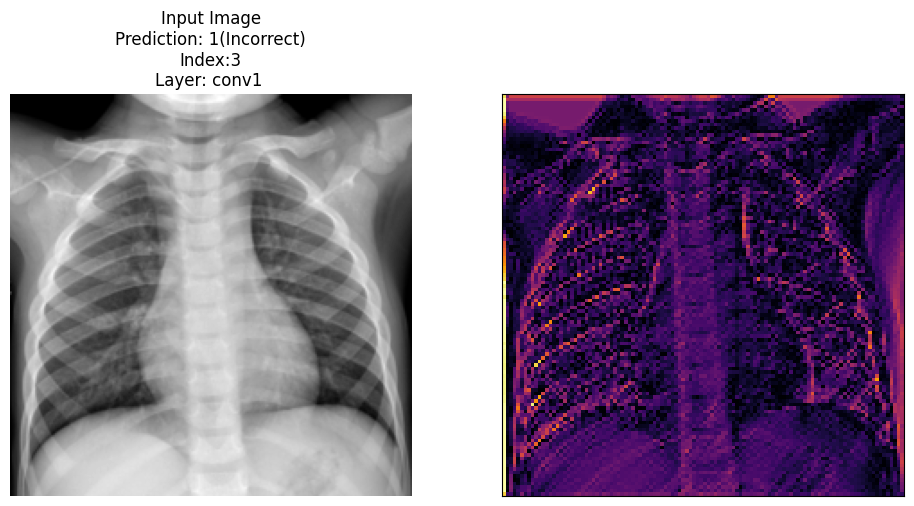

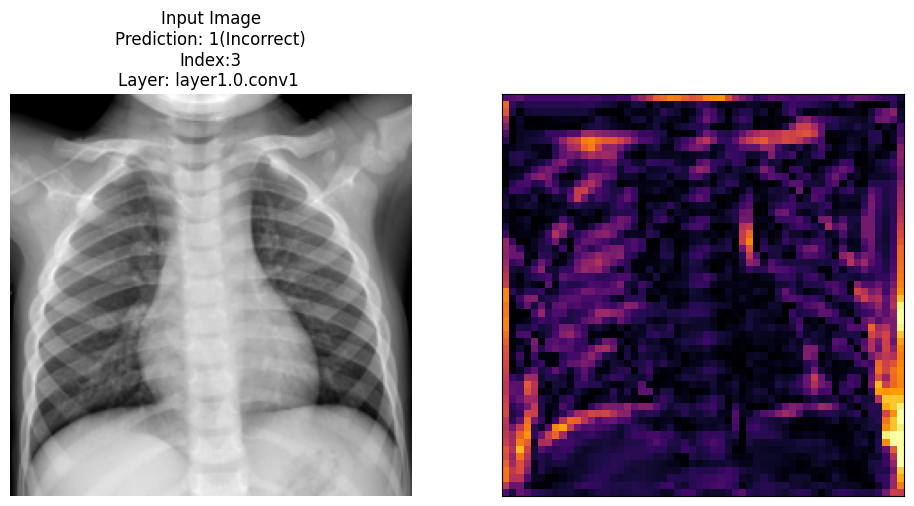

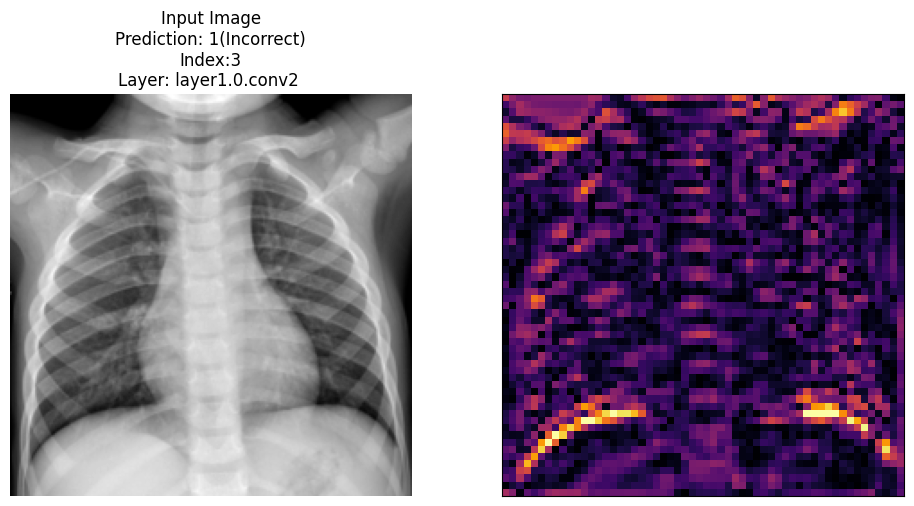

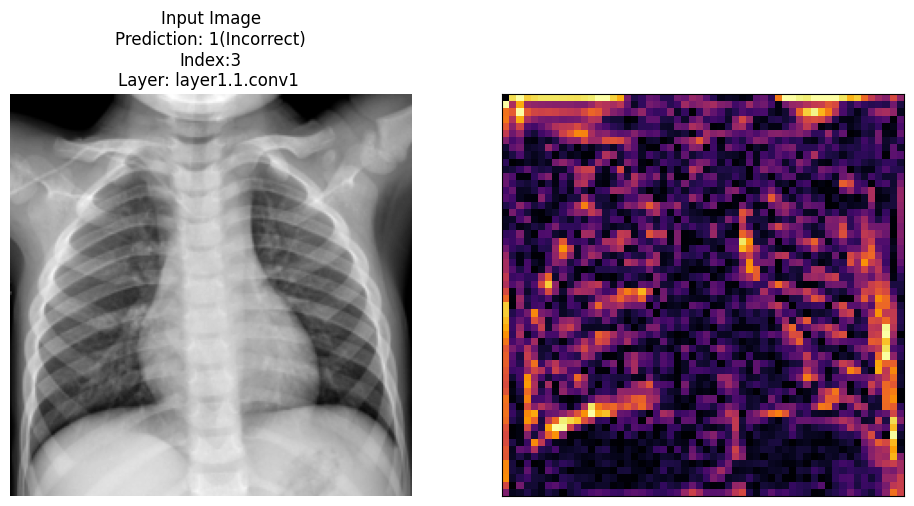

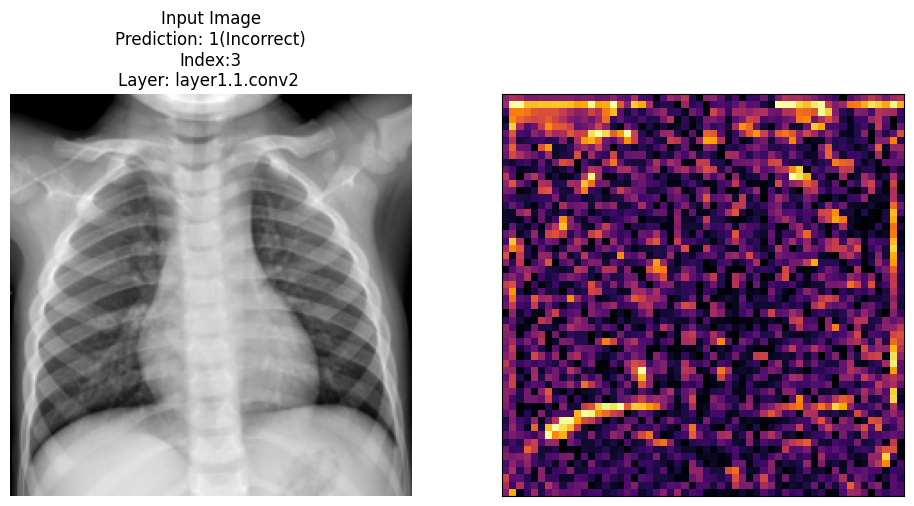

...

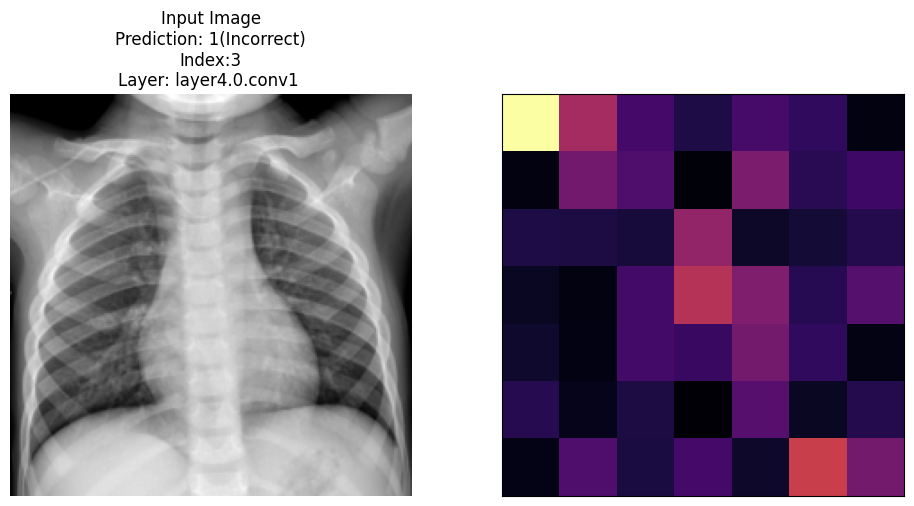

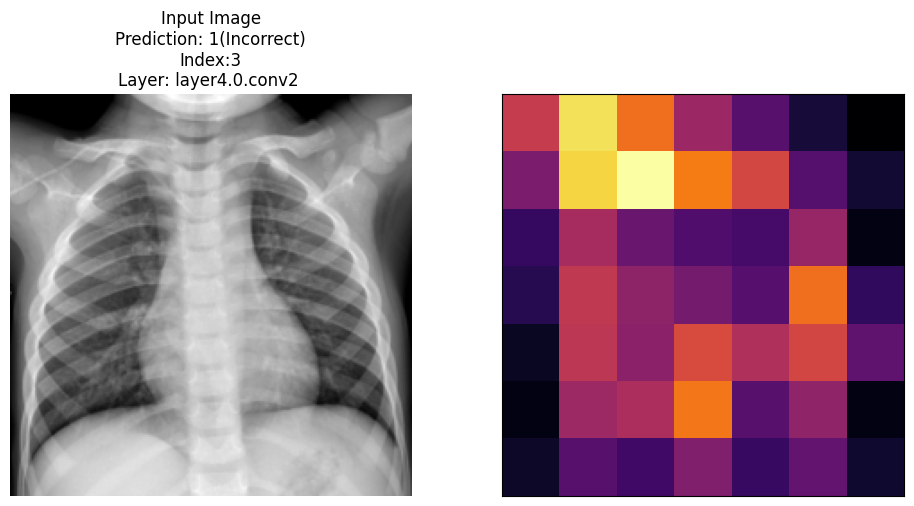

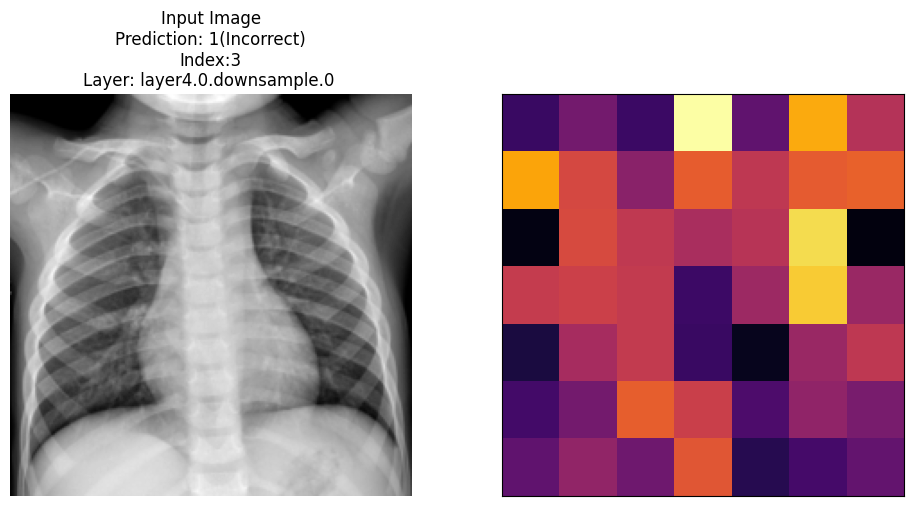

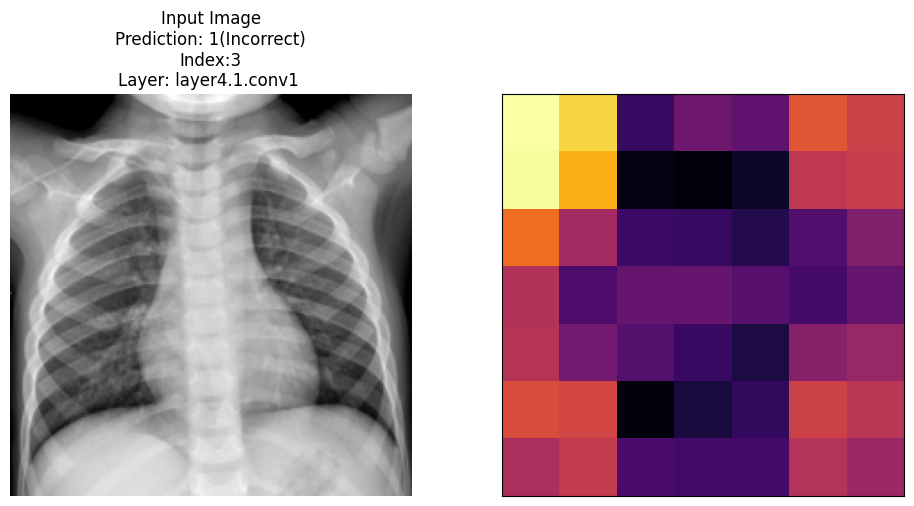

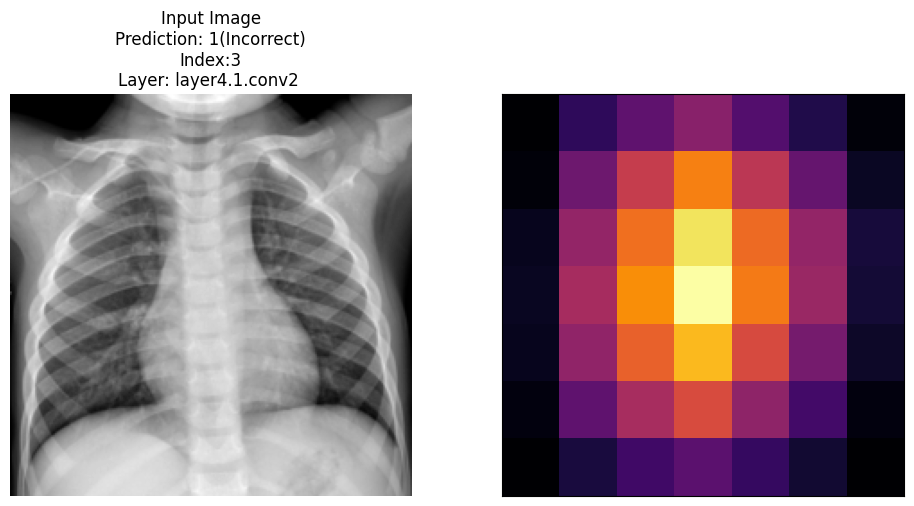

In [10]:
# Specify the indices to visualize
import matplotlib.pyplot as plt
import numpy as np
from captum.attr import Occlusion, visualization

ig = Occlusion(model)  # Initialize Occlusion
model.eval()
target_indices = {1,3}  # Set of target indices
processed_count = 0  # Initialize counter
max_samples = len(target_indices)  # Maximum number of samples to process
layer_names = [name for name, module in model.encoder.named_modules() if isinstance(module, torch.nn.Conv2d)]
layer_cams = {name: LayerGradCam(model, module) for name, module in model.encoder.named_modules() if name in layer_names}
for i, (images, labels) in enumerate(test_loader):
    if processed_count >= max_samples:
        break
    images, labels = images.to(device), labels.to(device)
    outputs = torch.sigmoid(model(images))
    predicted = (outputs > 0.5).long().item()
    is_correct = "Correct" if predicted == labels else "Incorrect"
    if i not in target_indices:
        continue
    print(labels)
    # 遍历每个卷积层
    for layer_name, grad_cam in layer_cams.items():
        # 计算 Grad-CAM
        attributions = grad_cam.attribute(images, target=0)

        # 转换为可视化格式
        attribution_np = attributions[0].detach().cpu().numpy()
        attribution_map = np.mean(attribution_np, axis=0)  # 平均通道维度

        # 原始输入图像
        image_np = images[0, 0].cpu().numpy()

        # 可视化
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(image_np, cmap="gray")
        axes[0].axis("off")
        axes[0].set_title(f"Input Image\nPrediction: {predicted}({is_correct})\nIndex:{i}\nLayer: {layer_name} ")

        visualization.visualize_image_attr(
            np.expand_dims(attribution_map, axis=-1),
            np.expand_dims(image_np, axis=-1),
            method="heat_map",
            cmap="inferno",
            show_colorbar=False,
            plt_fig_axis=(fig, axes[1]),
            use_pyplot=False
        )

        plt.tight_layout()
        plt.show()

    processed_count += 1
    if processed_count >= max_samples:
        break


In [11]:
layer = model.encoder.layer4[0].conv1

# Print its parameters
print("Weights shape:", layer.weight.shape)
print("Bias shape:", layer.bias.shape if layer.bias is not None else "No bias")
print("Kernel size:", layer.kernel_size)
print("Stride:", layer.stride)
print("Padding:", layer.padding)

Weights shape: torch.Size([512, 256, 3, 3])
Bias shape: No bias
Kernel size: (3, 3)
Stride: (2, 2)
Padding: (1, 1)
